# Download Data

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
%cd /content/drive/MyDrive/UDEMY/CNN/23DCNN/

/content/drive/MyDrive/UDEMY/CNN/23DCNN


# Import Libraries

In [ ]:
!pip install earthpy

In [6]:
import matplotlib.pyplot as plt

import numpy as np
import earthpy.plot as ep
import seaborn as sns
import earthpy.spatial as es

import plotly.graph_objects as go
import plotly.express as px

from scipy.io import loadmat

import pandas as pd

from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score,
                             confusion_matrix, classification_report)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, MaxPooling2D, Dropout, Flatten, Conv2D, LeakyReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

from tqdm import tqdm
from numpy.random import seed
from time import time

seed(11)

In [7]:
## GLOBAL VARIABLES
test_ratio = 0.3
windowSize = 3

In [8]:
def splitTrainTestSet(X, y, testRatio, randomState=345):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=testRatio, random_state=randomState,
                                                        stratify=y)
    return X_train, X_test, y_train, y_test

In [9]:
def padWithZeros(X, margin=2):
    newX = np.zeros((X.shape[0] + 2 * margin, X.shape[1] + 2* margin, X.shape[2]))
    x_offset = margin
    y_offset = margin
    newX[x_offset:X.shape[0] + x_offset, y_offset:X.shape[1] + y_offset, :] = X
    return newX

In [10]:
def createImageCubes(X, y, windowSize=5, removeZeroLabels = True):
    margin = int((windowSize - 1) / 2)
    zeroPaddedX = padWithZeros(X, margin=margin)
    # split patches
    patchesData = np.zeros((X.shape[0] * X.shape[1], windowSize, windowSize, X.shape[2]))
    patchesLabels = np.zeros((X.shape[0] * X.shape[1]))
    patchIndex = 0
    for r in range(margin, zeroPaddedX.shape[0] - margin):
        for c in range(margin, zeroPaddedX.shape[1] - margin):
            patch = zeroPaddedX[r - margin:r + margin + 1, c - margin:c + margin + 1]   
            patchesData[patchIndex, :, :, :] = patch
            patchesLabels[patchIndex] = y[r-margin, c-margin]
            patchIndex = patchIndex + 1
    if removeZeroLabels:
        patchesData = patchesData[patchesLabels>0,:,:,:]
        patchesLabels = patchesLabels[patchesLabels>0]
        patchesLabels -= 1
    return patchesData, patchesLabels

Load Data

# Load Data

In [11]:
################## X data (1096, 715, 102)   Hyperspectral satellite   (1096*715, 102)
data = loadmat('Pavia.mat')['pavia']


###################### Y data (labels)
gt = loadmat('Pavia_gt.mat')['pavia_gt']

print(f'Data Shape: {data.shape[:-1]}\nNumber of Bands: {data.shape[-1]}')

Data Shape: (1096, 715)
Number of Bands: 102


In [10]:
X, Y = createImageCubes(data, gt, windowSize=windowSize, removeZeroLabels = True)
X.shape, Y.shape

((148152, 3, 3, 102), (148152,))

In [11]:
Y.shape, np.min(Y), np.max(Y)

((148152,), 0.0, 8.0)

In [12]:
X_train, X_test, y_train, y_test = splitTrainTestSet(X, Y, test_ratio)
X_train, X_val, y_train, y_val = splitTrainTestSet(X_train, y_train, test_ratio)

# Data Visualization

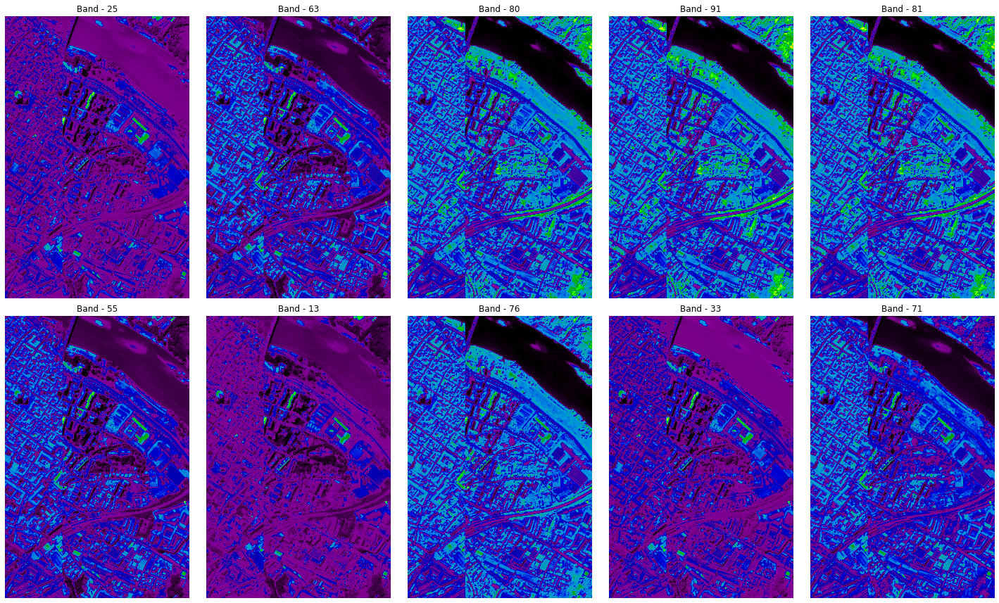

In [13]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('off')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()


# RGB Composite Image

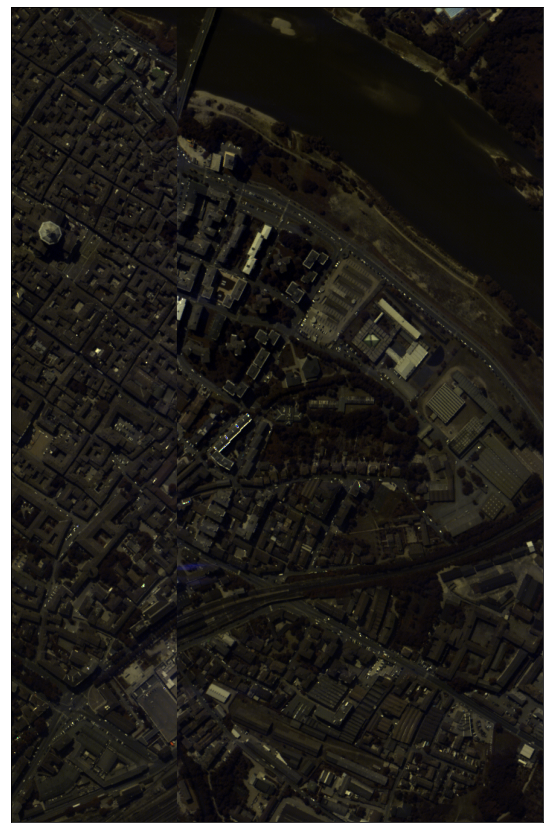

In [17]:
mdata = np.moveaxis(data, -1, 0)

ep.plot_rgb(mdata, (29, 23, 2), figsize=(15, 15)) 

plt.show()

# GroundTruth Visualizaation

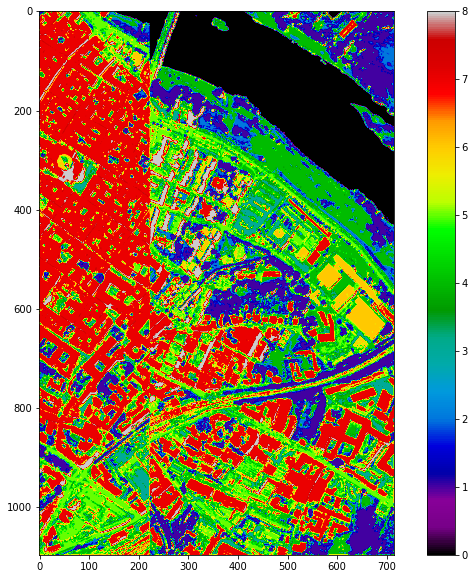

In [26]:
def plot_data(data):
  fig = plt.figure(figsize=(12, 10))
  plt.imshow(data, cmap='nipy_spectral')
  plt.colorbar()
  plt.axis('on')
  plt.show()

plot_data(gt)

# Build CNN

In [14]:
n_outputs =9

In [15]:
########## (n,W,H,B)

X_train.shape, 

NameError: ignored

In [17]:
model = Sequential(name = 'Pavia_CNN')

model.add(Conv2D(64, kernel_size=(2, 2),activation='linear',padding='same',input_shape=(3,3,102)))
model.add(LeakyReLU(alpha=0.1))
#model.add(MaxPooling2D((2, 2),padding='same'))

model.add(Conv2D(128, (3, 3), activation='linear',padding='same'))
model.add(LeakyReLU(alpha=0.1))
#model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

model.add(Conv2D(128, (3, 3), activation='linear',padding='same'))
model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

model.add(Flatten())

model.add(Dense(20, activation='linear'))
model.add(LeakyReLU(alpha=0.1))           
model.add(Dropout(0.4))

model.add(Dense(n_outputs, activation='softmax'))
model.summary()

Model: "Pavia_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 3, 3, 64)          26176     
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 3, 3, 64)          0         
                                                                 
 conv2d_4 (Conv2D)           (None, 3, 3, 128)         73856     
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 3, 3, 128)         0         
                                                                 
 conv2d_5 (Conv2D)           (None, 3, 3, 128)         147584    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 3, 3, 128)         0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 2, 2, 128)        0 

In [25]:
2*2*256

1024

In [25]:
y_train.shape

(72594, 9)

In [16]:
y_train=tf.keras.utils.to_categorical(y_train)
y_train.shape

(72594, 9)

In [17]:
y_val=tf.keras.utils.to_categorical(y_val)
y_val.shape

(31112, 9)

In [19]:
y_test=tf.keras.utils.to_categorical(y_test)
y_test.shape

(44446, 9)

In [18]:
y_train.shape, y_val.shape, y_test.shape

((72594, 9), (31112, 9), (44446,))

In [20]:
X_train.shape, X_val.shape, X_test.shape

((72594, 3, 3, 102), (31112, 3, 3, 102), (44446, 3, 3, 102))

In [21]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [22]:
early_stop = EarlyStopping(monitor = 'val_loss',
                            mode = 'min',
                            min_delta = 0,
                            patience = 10,
                            restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Pavia_Model2.h5', 
                             monitor = 'val_loss', 
                             mode ='min', 
                             save_best_only = True)

tensorboard = TensorBoard(log_dir='SA_logs/{}'.format(time()))

In [23]:
hist = model.fit(X_train, 
                       y_train, 
                       epochs = 5, 
                       batch_size = 512, 
                       validation_data = (X_val, y_val), 
                       callbacks=[early_stop,
                                  checkpoint,
                                  tensorboard])
 

Epoch 1/5
142/142 [==============================] - 51s 342ms/step - loss: 12.6290 - accuracy: 0.8077 - val_loss: 0.3376 - val_accuracy: 0.9445
Epoch 2/5
142/142 [==============================] - 49s 346ms/step - loss: 0.4319 - accuracy: 0.9189 - val_loss: 0.1225 - val_accuracy: 0.9702
Epoch 3/5
142/142 [==============================] - 43s 301ms/step - loss: 0.2648 - accuracy: 0.9401 - val_loss: 0.0989 - val_accuracy: 0.9702
Epoch 4/5
142/142 [==============================] - 42s 299ms/step - loss: 0.2218 - accuracy: 0.9459 - val_loss: 0.1144 - val_accuracy: 0.9637
Epoch 5/5
142/142 [==============================] - 43s 303ms/step - loss: 0.1954 - accuracy: 0.9516 - val_loss: 0.0895 - val_accuracy: 0.9742


In [25]:
model.save('Pavia_Model2.h5')

In [33]:
%load_ext tensorboard

%tensorboard --logdir SA_logs/

<IPython.core.display.Javascript object>

In [34]:
hist = pd.DataFrame(data= hist.history)

fig = go.Figure()

fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                    mode='lines+markers',
                    name='Train Loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                    mode='lines+markers',
                    name='Train Accuracy'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                    mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                    mode='lines+markers', name='Test Accuracy'))

fig.show()

In [35]:
loss, acc = model.evaluate(X_test, y_test)

1389/1389 [==============================] - 11s 8ms/step - loss: 0.1388 - accuracy: 0.9567


In [36]:
print(f"Accuracy: {acc*100}\nLoss: {loss}")

Accuracy: 95.67115306854248
Loss: 0.13877883553504944


In [38]:
from tensorflow.keras.models import load_model

model = load_model("Pavia_Model2.h5")

In [39]:
pred = np.argmax(model.predict(X_test), axis=1)

# Classification Report
print(classification_report(pred, np.argmax(y_test, 1)))

1389/1389 [==============================] - 10s 7ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19795
           1       0.84      0.98      0.90      1964
           2       0.95      0.71      0.81      1243
           3       0.83      0.74      0.78       894
           4       0.92      0.94      0.93      1935
           5       0.96      0.88      0.92      3022
           6       0.86      0.99      0.92      1908
           7       1.00      1.00      1.00     12831
           8       0.99      1.00      1.00       854

    accuracy                           0.97     44446
   macro avg       0.93      0.92      0.92     44446
weighted avg       0.98      0.97      0.97     44446



In [57]:
pred.shape

(44446,)

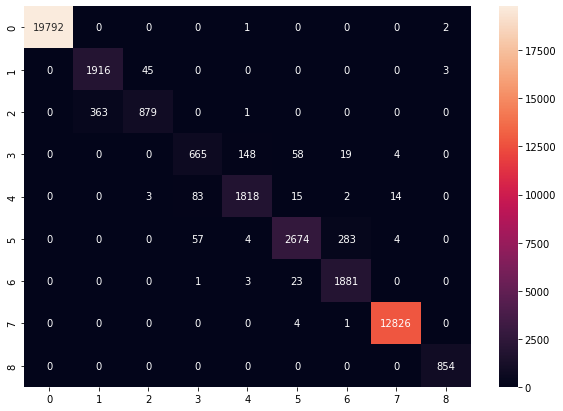

In [40]:
plt.figure(figsize = (10,7))


mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))

df_cm = pd.DataFrame(mat)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()

# Predicting whole image

In [12]:
data.shape

(1096, 715, 102)

In [18]:
model.load_weights("Pavia_Model2.h5")

In [19]:
X11, Y11 = createImageCubes(data, gt, windowSize=windowSize, removeZeroLabels = False)

In [20]:
prediction = np.argmax(model.predict(X11), axis=1)

24489/24489 [==============================] - 132s 5ms/step


In [21]:
np.min(prediction), np.max(prediction)


(0, 8)

In [22]:
prediction_reshaped = prediction.reshape(1096,715)

In [23]:
gt=prediction_reshaped

In [24]:
gt.shape

(1096, 715)

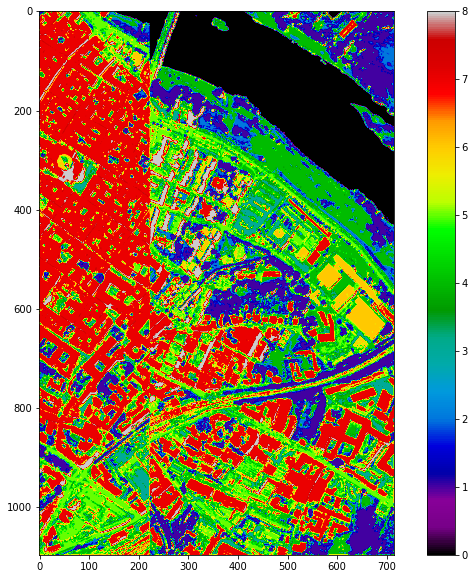

In [27]:
plot_data(prediction_reshaped)